In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [3]:
sales_data = pd.read_csv("sales_data_updated.csv")
google_search_data=pd.read_excel("Case_Study/Emerging Business Opportunities (Karthik)/Data/google_search_data.xlsx", sheet_name="google_search_data_1111")
social_media_data=pd.read_excel("Case_Study/Emerging Business Opportunities (Karthik)/Data/Social_Media_data_v1.xlsx", sheet_name = "Sheet1")


In [4]:
pdt_man_list = pd.read_csv("Case_Study/Emerging Business Opportunities (Karthik)/Data/product_manufacturer_list.csv")

In [5]:
theme_list = pd.read_csv("Case_Study/Emerging Business Opportunities (Karthik)/Data/Theme_list.csv")
theme_pdt_list = pd.read_csv("Case_Study_Original/Emerging Business Opportunities (Karthik)/Data/Theme_product_list.csv")

In [6]:
sales_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4526182 entries, 0 to 4526181
Data columns (total 68 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Unnamed: 0             int64  
 1   system_calendar_key_N  int64  
 2   product_id             int64  
 3   sales_dollars_value    float64
 4   sales_units_value      int64  
 5   sales_lbs_value        int64  
 6   year                   int64  
 7   month                  int64  
 8   Date                   object 
 9   claim_id               object 
 10  Vendor                 object 
 11  Week_No.               int64  
 12  total_media_post       int64  
 13  google_search_volume   int64  
 14  430                    int64  
 15  32                     int64  
 16  211                    int64  
 17  432                    int64  
 18  81                     int64  
 19  185                    int64  
 20  171                    int64  
 21  145                    int64  
 22  15                

In [5]:
df1 = theme_pdt_list.groupby("PRODUCT_ID")["CLAIM_ID"].apply(list).reset_index(name="Claim_ID")

In [6]:
df1

,PRODUCT_ID,Claim_ID
0,1,[0]
1,2,[0]
2,3,[0]
3,4,[0]
4,5,[0]
...,...,...
57312,57313,[8]
57313,57314,"[40, 8]"
57314,57315,[8]
57315,57316,[8]


In [10]:
sales_data.head()
type(sales_data["system_calendar_key_N"][1])

numpy.int64

In [7]:
def get_year(x):
    return str(x)[:4]
def get_month(x):
    return (x)[4:6]
def get_date(x):
    return pd.datetime(int(str(x)[:4]), int((x)[4:6]), int((x)[6:]))
sales_data["system_calendar_key_N"] = sales_data["system_calendar_key_N"].map(str)
sales_data["year"] = sales_data["system_calendar_key_N"].apply(lambda x: get_year(x))
sales_data["month"] = sales_data["system_calendar_key_N"].apply(lambda x: get_month(x))
sales_data["Date"] = sales_data["system_calendar_key_N"].apply(lambda x: get_date(x))

C:\Users\mahathi.paidimar\AppData\Local\Temp\ipykernel_2512\907213427.py:6: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  return pd.datetime(int(str(x)[:4]), int((x)[4:6]), int((x)[6:]))


In [66]:
sales_data["Week_No."] = sales_data["Date"].dt.week

C:\Users\mahathi.paidimar\AppData\Local\Temp\ipykernel_2512\776712982.py:1: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  sales_data["Week_No."] = sales_data["Date"].dt.week


In [42]:
pdt_man_list["PRODUCT_ID"].nunique()

67175

In [31]:
sales_data["claim_id"] = sales_data["product_id"].map(lambda x: ("".join(str(df1[df1["PRODUCT_ID"] == x]["Claim_ID"]).split("\n")[0].split(" ")[4:])))

In [57]:
(" ".join(str((pdt_man_list[pdt_man_list["PRODUCT_ID"] == 1])["Vendor"]).split("\n")[0].split(" ")[4:]))

'Others'

In [58]:
sales_data["Vendor"] = sales_data["product_id"].map(lambda x: (" ".join(str((pdt_man_list[pdt_man_list["PRODUCT_ID"] == x])["Vendor"]).split("\n")[0].split(" ")[4:])))

In [199]:
sales_data.to_csv("sales_data_updated.csv")

In [186]:
sales_data

,system_calendar_key_N,product_id,sales_dollars_value,sales_units_value,sales_lbs_value,year,month,Date,claim_id,Vendor,Week_No.,total_media_post
0,20160109,1,13927.0,934,18680,2016,1,2016-01-09,[0],Others,1,454100
1,20160109,3,10289.0,1592,28646,2016,1,2016-01-09,[0],Others,1,454100
2,20160109,4,357.0,22,440,2016,1,2016-01-09,[0],Others,1,454100
3,20160109,6,23113.0,2027,81088,2016,1,2016-01-09,[0],Others,1,454100
4,20160109,7,23177.0,3231,58164,2016,1,2016-01-09,[0],Others,1,454100
...,...,...,...,...,...,...,...,...,...,...,...,...
4526177,20181027,47536,8.0,2,3,2018,10,2018-10-27,[0],Private Label,43,2956691
4526178,20181027,47539,391.0,39,68,2018,10,2018-10-27,[0],Private Label,43,2956691
4526179,20181027,47543,105.0,59,48,2018,10,2018-10-27,"[227,8]",Private Label,43,3684
4526180,20181027,47544,3720.0,1246,4361,2018,10,2018-10-27,[0],Private Label,43,2956691


In [104]:
df2 = (pd.DataFrame(social_media_data.groupby(["Theme Id", "YEAR", "WEEK_NUM"])["total_post"]
                    .apply(list).reset_index(name="total_post")))

In [105]:
df2

,Theme Id,YEAR,WEEK_NUM,total_post
0,0,2015,2,"[13, 17, 16, 13, 23, 614, 573, 556, 437, 780, ..."
1,0,2015,3,"[37, 16, 444, 569, 0, 1, 6025, 5402, 3651, 373..."
2,0,2015,6,"[12, 24, 647, 564, 1, 0, 4643, 5046, 3893, 264..."
3,0,2015,7,"[8, 18, 21, 11, 22, 587, 745, 593, 588, 855, 2..."
4,0,2015,10,"[16, 11, 572, 766, 1, 4, 4804, 4287, 5565, 234..."
...,...,...,...,...
48415,999,2019,44,"[62, 39, 9, 11, 14, 11, 28]"
48416,999,2019,45,"[37, 12, 4, 13, 32, 408, 33]"
48417,999,2019,46,[25]
48418,999,2019,49,"[11, 8, 36, 12, 15, 22, 46]"


In [178]:
def get_total_post(a, b, c):
    s = 0
    l = (list(a[1:-1].replace("..","").split(",")))
    for i in l:
        if i!="":
            l1 = (list((df2[(df2["Theme Id"] == int(i)) & (df2["WEEK_NUM"] == b) & (df2["YEAR"] == c)]["total_post"])))
            if len(l1) > 0:
                s = s + sum(l1[0])
    return s

In [179]:
sales_data['total_media_post'] = list(map(get_total_post, sales_data['claim_id'], sales_data['Week_No.'], sales_data['year']))

In [188]:
df3 = (pd.DataFrame(google_search_data.groupby(["Claim_ID", "year_new", "week_number"])["searchVolume"]
                    .apply(list).reset_index(name="searchVolume")))

In [189]:
df3

,Claim_ID,year_new,week_number,searchVolume
0,8,2014,1,"[6613, 6867, 4451, 6994, 5341]"
1,8,2014,2,"[4451, 4197, 5595, 4451, 8266, 7503, 6740]"
2,8,2014,3,"[8647, 5214, 8011, 11190, 8520, 6994, 5595]"
3,8,2014,4,"[5595, 4832, 4197, 7503, 8647, 4578, 4324]"
4,8,2014,5,"[6613, 9664, 5595, 3942, 8011, 6104, 8902]"
...,...,...,...,...
28481,999,2019,36,"[42, 515, 1029, 42, 1286, 772, 1286, 772]"
28482,999,2019,37,"[772, 772, 1029, 772, 167, 2571, 515]"
28483,999,2019,38,"[2314, 258, 1286, 515, 772, 258]"
28484,999,2019,39,"[772, 772, 258, 772, 258, 1286]"


In [191]:
def get_search_volume(a, b, c):
    s = 0
    l = (list(a[1:-1].replace("..","").split(",")))
    for i in l:
        if i!="":
            l1 = (list((df3[(df3["Claim_ID"] == int(i)) & (df3["week_number"] == b) & (df3["year_new"] == c)]["searchVolume"])))
            if len(l1) > 0:
                s = s + sum(l1[0])
    return s

In [192]:
sales_data['google_search_volume'] = list(map(get_search_volume, sales_data['claim_id'], sales_data['Week_No.'], sales_data['year']))

In [80]:
sales_data["year"] = sales_data["year"].astype("int64")
sales_data["system_calendar_key_N"] = sales_data["system_calendar_key_N"].astype("int64")
sales_data["month"] = sales_data["month"].astype("int64")
sales_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4526182 entries, 0 to 4526181
Data columns (total 11 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   system_calendar_key_N  int64         
 1   product_id             int64         
 2   sales_dollars_value    float64       
 3   sales_units_value      int64         
 4   sales_lbs_value        int64         
 5   year                   int64         
 6   month                  int64         
 7   Date                   datetime64[ns]
 8   claim_id               object        
 9   Vendor                 object        
 10  Week_No.               int64         
dtypes: datetime64[ns](1), float64(1), int64(7), object(2)
memory usage: 379.9+ MB


In [11]:
##Function for identifying claim id for each record in google search data
l =[]
def get_claim_name(x):
    for i in theme_list["CLAIM_ID"]:
        if x == i:
            l.append((theme_list[theme_list["CLAIM_ID"] == x]["Claim Name"]).to_string().split("   ")[1].strip())
google_search_data["Claim_ID"].apply(get_claim_name)            
google_search_data["Claim Name"] = l

In [12]:
l = []
social_media_data["Theme Id"].apply(get_claim_name)
social_media_data["Claim Name"] = l

In [29]:
social_media_data.head()

,Theme Id,published_date,total_post,YEAR,MONTH,WEEK_NUM,Claim Name
0,148,10-01-2015,76,2015,Jan,2,tuna
1,148,10-10-2015,31,2015,Oct,41,tuna
2,148,10-11-2015,65,2015,Nov,46,tuna
3,148,10-12-2015,88,2015,Dec,50,tuna
4,148,13-10-2015,85,2015,Oct,42,tuna


# List of themes available across all data sources

In [18]:
t = []
l1 = []
def get_unique_themes(x):
    l = (list(x[1:-1].replace(".","").split(",")))
    for i in l:
        l1.append(i)
        if (i!="") and (i not in t):
            t.append(i)

In [19]:
sales_data["claim_id"].map(lambda x: get_unique_themes(x))

0          None
1          None
2          None
3          None
4          None
           ... 
4526177    None
4526178    None
4526179    None
4526180    None
4526181    None
Name: claim_id, Length: 4526182, dtype: object

In [21]:
#####NUMBER OF UNIQUE THEMES IN SALES DATA

unique_themes_in_sales = list(map(int, set(t)))
print(unique_themes_in_sales)


[152, 125, 148, 437, 0, 75, 15, 207, 220, 193, 100, 145, 228, 18, 81, 38, 43, 227, 224, 187, 287, 430, 58, 73, 178, 186, 16, 163, 39, 191, 192, 171, 432, 151, 147, 65, 22, 393, 8, 211, 433, 2, 384, 142, 101, 158, 222, 32, 185, 438, 385, 1, 120, 40]


In [22]:
total_themes = set(list(theme_list["Claim Name"].dropna()))
themes_in_sales=set(unique_themes_in_sales)
themes_in_google=set(list(google_search_data["Claim_ID"].dropna()))
themes_in_social=set(list(social_media_data["Theme Id"].dropna()))
print("Total unique available across Sales data ",len(set(themes_in_sales)))
print(themes_in_sales)
print()
print("Total unique available across Google Search data ",len(set(themes_in_google)))
print(themes_in_google)
print()
print("Total number of themes available across social media data ",len(set(themes_in_social)))
print(themes_in_social)
print()
total_themes_in_all_datasources=set(list(themes_in_social)+list(themes_in_sales)+list(themes_in_google))
total_themes_in_all_datasources.remove(0)
print("Total number of themes available across all data sources ",len(total_themes_in_all_datasources))
print()
print(total_themes_in_all_datasources)

Total unique available across Sales data  54
{0, 384, 2, 385, 1, 8, 393, 142, 15, 16, 145, 18, 147, 148, 22, 151, 152, 158, 287, 32, 163, 38, 39, 40, 43, 171, 430, 432, 433, 178, 437, 438, 185, 58, 187, 186, 191, 192, 193, 65, 73, 75, 207, 81, 211, 220, 222, 224, 227, 100, 228, 101, 120, 125}

Total unique available across Google Search data  160
{514, 516, 519, 8, 526, 531, 536, 541, 543, 39, 40, 555, 556, 558, 566, 567, 574, 576, 65, 583, 587, 75, 79, 81, 594, 600, 601, 605, 606, 608, 100, 613, 101, 615, 616, 618, 620, 622, 632, 120, 634, 125, 650, 138, 139, 142, 657, 659, 148, 151, 152, 668, 158, 670, 163, 677, 681, 682, 683, 684, 173, 177, 689, 187, 702, 191, 192, 704, 193, 707, 197, 713, 716, 207, 720, 211, 732, 737, 738, 227, 228, 741, 743, 747, 754, 755, 761, 770, 777, 780, 782, 785, 788, 789, 799, 803, 813, 816, 821, 823, 832, 839, 842, 843, 844, 847, 852, 860, 867, 869, 870, 877, 884, 887, 889, 384, 900, 901, 903, 904, 393, 906, 907, 908, 913, 915, 916, 918, 922, 928, 929, 930

# Consumer preference(themes) available in each data source

In [ ]:
########CONSUMER PREFERENCE IN SALES_DATA

In [7]:
uts = list(unique_themes_in_sales)

themes_dict = {uts[i]: 0 for i in range(0, len(uts))}

In [34]:
con_pref_df = pd.DataFrame(list(themes_dict.items()),columns = ['claim_id','total_sales'])

In [35]:
con_pref_df["claim_id"] = con_pref_df["claim_id"].astype("int64")

In [27]:
sales_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4526182 entries, 0 to 4526181
Data columns (total 14 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Unnamed: 0             int64  
 1   system_calendar_key_N  int64  
 2   product_id             int64  
 3   sales_dollars_value    float64
 4   sales_units_value      int64  
 5   sales_lbs_value        int64  
 6   year                   int64  
 7   month                  int64  
 8   Date                   object 
 9   claim_id               object 
 10  Vendor                 object 
 11  Week_No.               int64  
 12  total_media_post       int64  
 13  google_search_volume   int64  
dtypes: float64(1), int64(10), object(3)
memory usage: 483.4+ MB


In [36]:
con_pref_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   claim_id     54 non-null     int64
 1   total_sales  54 non-null     int64
dtypes: int64(2)
memory usage: 992.0 bytes


In [33]:
google_search_data.head()

,date,platform,searchVolume,Claim_ID,week_number,year_new,MONTH,Claim Name
0,2014-01-05,google,349,916,1,2014,Jan,gluten free
1,2014-01-06,google,349,916,2,2014,Jan,gluten free
2,2014-01-07,google,697,916,2,2014,Jan,gluten free
3,2014-01-10,google,349,916,2,2014,Jan,gluten free
4,2014-01-20,google,697,916,4,2014,Jan,gluten free


In [35]:
gdf = google_search_data.groupby("Claim Name")["searchVolume"].sum().sort_values(ascending = False)

Text(0.5, 1.0, 'Theme Preference in Google Search Data')

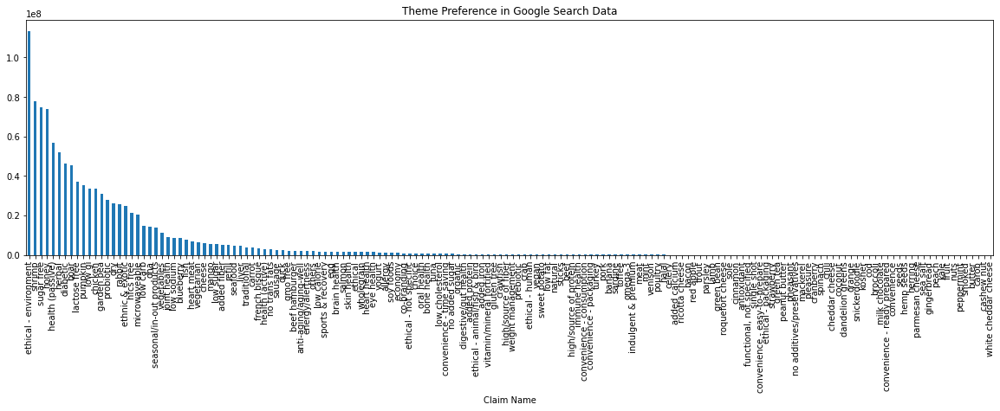

In [36]:
gdf.plot(kind = "bar")
plt.title("Theme Preference in Google Search Data")

In [37]:
df = (google_search_data.groupby(["platform","Claim Name"])["searchVolume"].sum())
df

platform  Claim Name   
amazon    added calcium       113
          added fiber      182727
          added iron         1793
          added protein      1240
          allergy            2831
                            ...  
walmart   toffee               74
          traditional       33990
          vegetables         1563
          vegetarian           33
          yogurt              481
Name: searchVolume, Length: 402, dtype: int64

In [39]:
df["amazon"] = df["amazon"].sort_values(ascending = False)
df["chewy"] = df["chewy"].sort_values(ascending = False)
df["google"] = df["google"].sort_values(ascending = False)
df["walmart"] = df["walmart"].sort_values(ascending = False)

In [40]:
plt.rcParams['figure.figsize'] = [20, 5]

Text(0.5, 1.0, 'Theme Preference in Amazon Platform in Google Search Data')

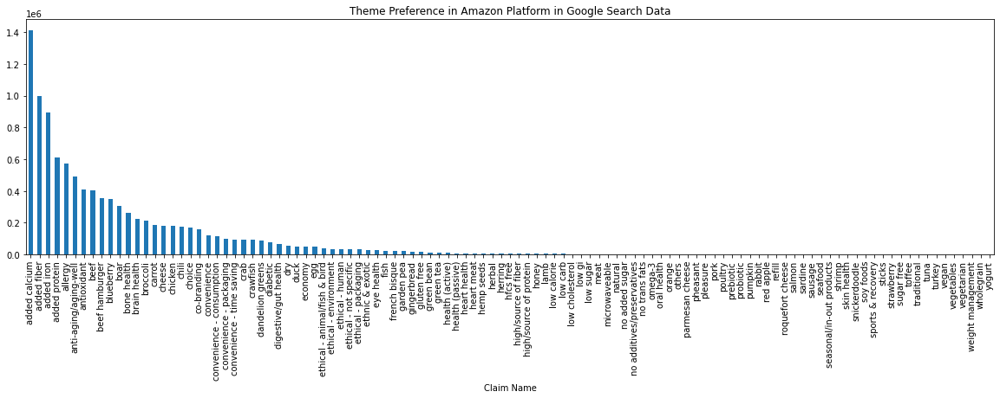

In [43]:
df["amazon"].plot(kind = "bar")
plt.title("Theme Preference in Amazon Platform in Google Search Data")

Text(0.5, 1.0, 'Theme Preference in Chewy Platform in Google Search Data')

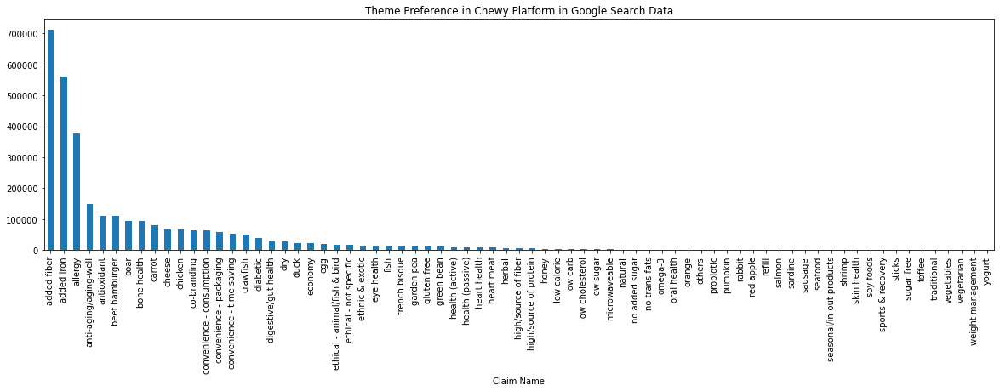

In [41]:
df["chewy"].plot(kind = "bar")
plt.title("Theme Preference in Chewy Platform in Google Search Data")

Text(0.5, 1.0, 'Theme Preference in Google Platform in Google Search Data')

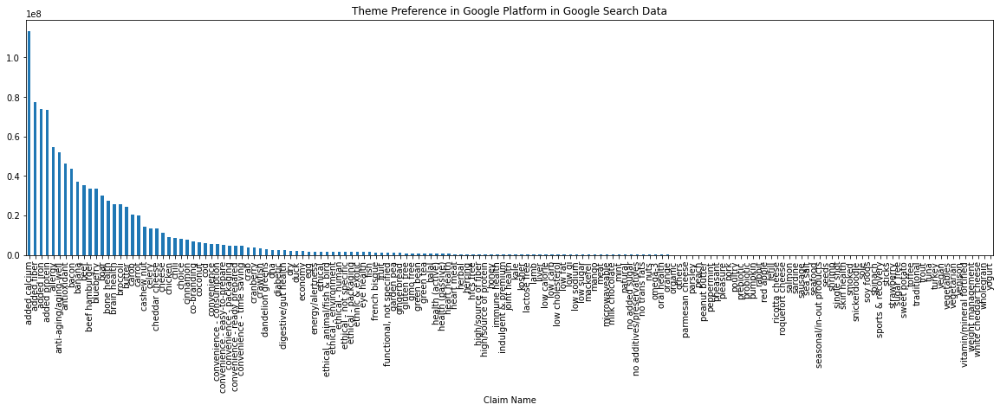

In [44]:
df["google"].plot(kind = "bar")
plt.title("Theme Preference in Google Platform in Google Search Data")

Text(0.5, 1.0, 'Theme Preference in Walmart Platform in Google Search Data')

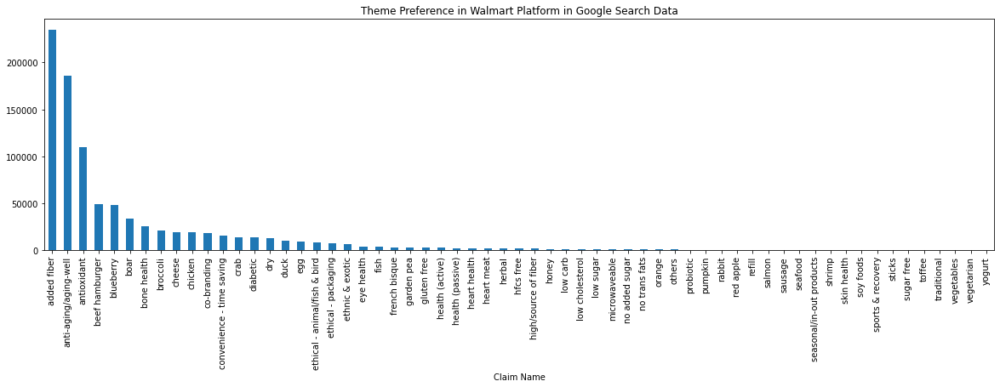

In [45]:
df["walmart"].plot(kind = "bar")
plt.title("Theme Preference in Walmart Platform in Google Search Data")

In [46]:
social_media_data_modified = social_media_data[social_media_data["Theme Id"] != 0]

In [47]:
social_media_data_modified

,Theme Id,published_date,total_post,YEAR,MONTH,WEEK_NUM,Claim Name
0,148,10-01-2015,76,2015,Jan,2,tuna
1,148,10-10-2015,31,2015,Oct,41,tuna
2,148,10-11-2015,65,2015,Nov,46,tuna
3,148,10-12-2015,88,2015,Dec,50,tuna
4,148,13-10-2015,85,2015,Oct,42,tuna
...,...,...,...,...,...,...,...
533385,876,09-05-2019,4658,2019,May,19,caramel
533386,876,09-06-2019,3731,2019,Jun,24,caramel
533387,876,09-07-2019,2336,2019,Jul,28,caramel
533388,876,09-08-2019,1374,2019,Aug,32,caramel


<AxesSubplot:xlabel='Claim Name'>

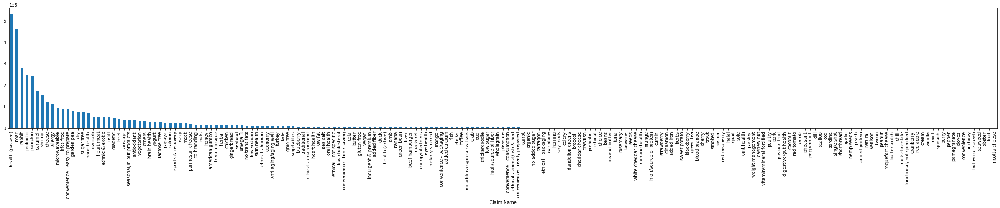

In [48]:
plt.rcParams['figure.figsize'] = [40, 5]
social_media_data_modified.groupby("Claim Name")["total_post"].sum().sort_values(ascending = False).plot(kind = "bar")

# Analysis Based on Time Granularity on each data source

## For Sales Data

In [11]:
sales_data.head()

,system_calendar_key_N,product_id,sales_dollars_value,sales_units_value,sales_lbs_value,Claim ID,Vendor,Claim Name,Date,year,month
0,20160109,29698,185,31,17,147,A,american gumbo,09-01-2016,2016,01
1,20160116,29698,264,45,25,147,A,american gumbo,16-01-2016,2016,01
2,20160123,11925,150,5,45,147,A,american gumbo,23-01-2016,2016,01
3,20160123,29698,188,35,20,147,A,american gumbo,23-01-2016,2016,01
4,20160130,11925,130,5,45,147,A,american gumbo,30-01-2016,2016,01


In [12]:
len(sales_data['Claim Name'].unique())

43

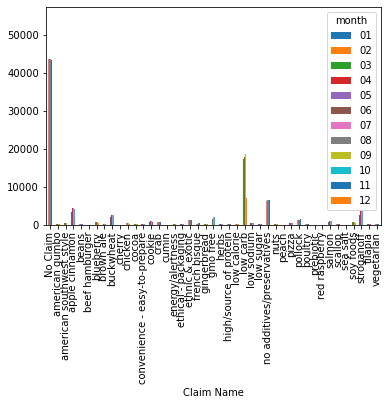

In [13]:
sales_data.groupby(["Claim Name","month"])["Claim Name"].count().unstack(level=1).plot(kind = "bar")
plt.rcParams['figure.figsize'] = [50,25]
#plt.legend(bbox_to_anchor=(1.02, 1.0))

<AxesSubplot:xlabel='month'>

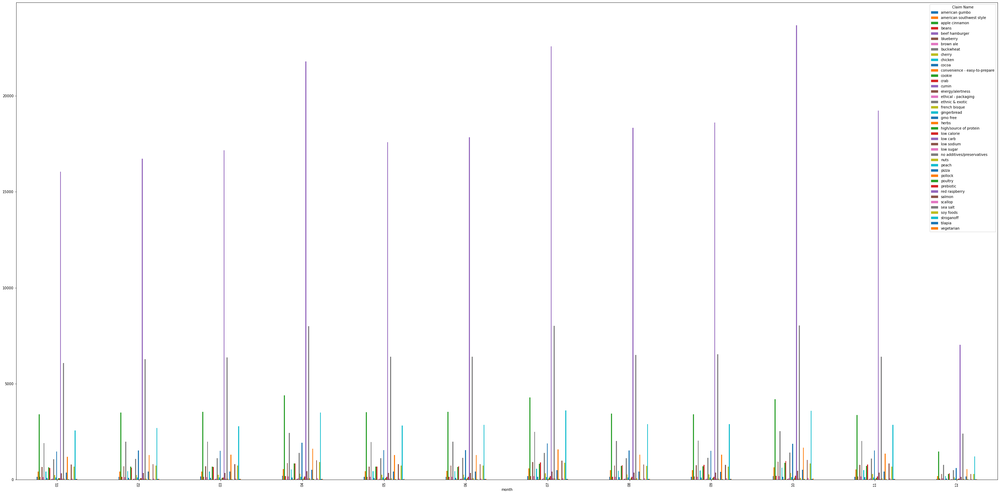

In [14]:
r=sales_data.groupby(["month","Claim Name"])["Claim Name"].count().unstack(level=1)
r = r.drop(labels='No Claim', axis=1)
plt.rcParams['figure.figsize'] = [50,25]
r.plot(kind='bar')

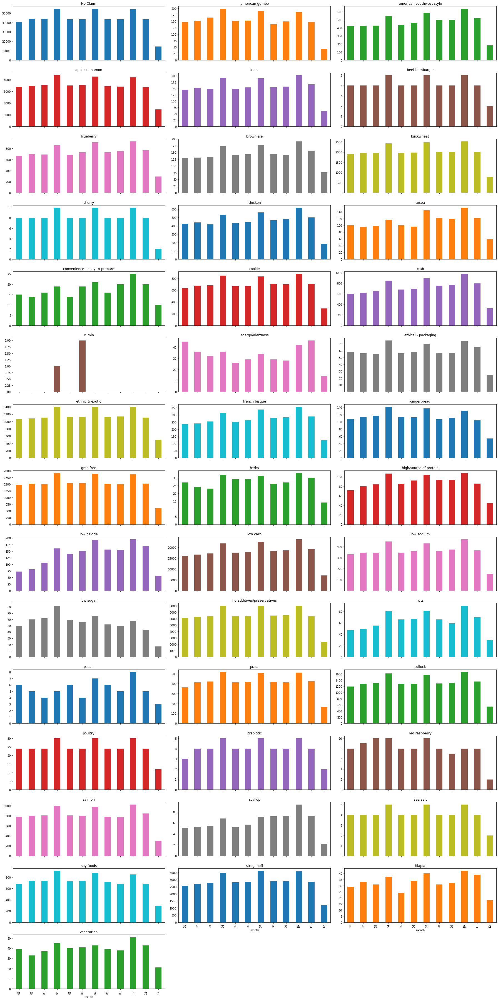

In [20]:
r1=sales_data.groupby(["month","Claim Name"])["Claim Name"].count().unstack(level=1)
r1.plot(kind = 'bar',subplots=True,layout = (15,3),legend = None)
#plt.rcParams['figure.figsize'] = [25, 50]
plt.tight_layout()

## For Google Search Data

In [16]:
google_search_data.head()

,date,platform,searchVolume,Claim_ID,week_number,year_new,Claim Name
0,05-01-2014,google,349,916,1,2014,gluten free
1,06-01-2014,google,349,916,2,2014,gluten free
2,07-01-2014,google,697,916,2,2014,gluten free
3,10-01-2014,google,349,916,2,2014,gluten free
4,20-01-2014,google,697,916,4,2014,gluten free


In [17]:
len(google_search_data["Claim Name"].unique())

160

Yearly Analysis

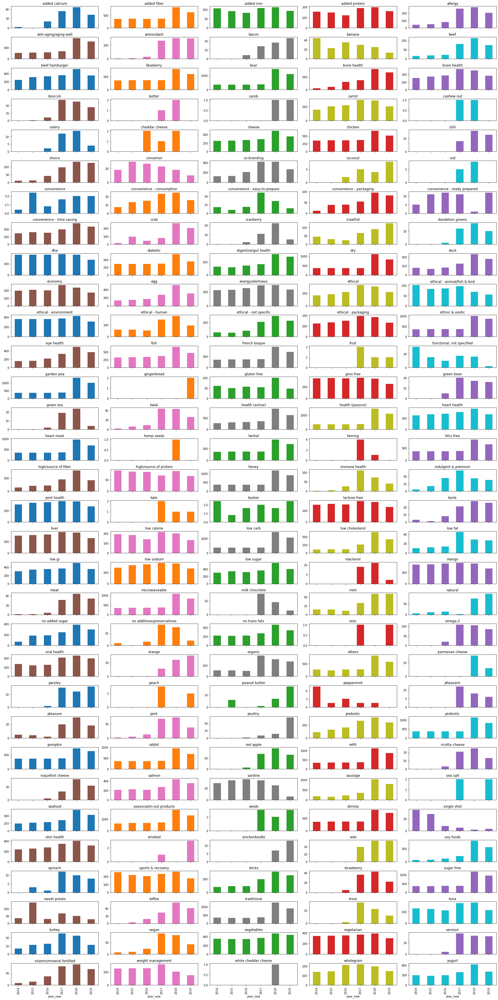

In [18]:
r1=google_search_data.groupby(["year_new","Claim Name"])["Claim Name"].count().unstack(level=1)
r1.plot(kind = 'bar',subplots=True,layout = (32,5),legend = None)
#plt.rcParams['figure.figsize'] = [25, 30]
plt.tight_layout()

Weekly Analysis

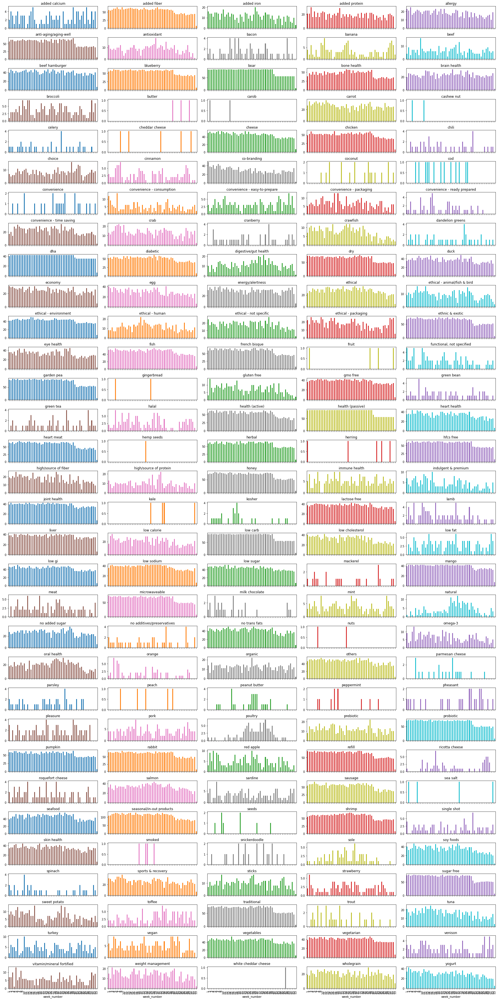

In [19]:
r1=google_search_data.groupby(["week_number","Claim Name"])["Claim Name"].count().unstack(level=1)
r1.plot(kind = 'bar',subplots=True,layout = (32,5),legend = None)
#plt.rcParams['figure.figsize'] = [25, 30]
plt.tight_layout()

Monthly Analysis

In [21]:
type(google_search_data["date"][1])

str

In [22]:
google_search_data.head()

,date,platform,searchVolume,Claim_ID,week_number,year_new,Claim Name
0,05-01-2014,google,349,916,1,2014,gluten free
1,06-01-2014,google,349,916,2,2014,gluten free
2,07-01-2014,google,697,916,2,2014,gluten free
3,10-01-2014,google,349,916,2,2014,gluten free
4,20-01-2014,google,697,916,4,2014,gluten free


In [23]:
google_search_data['month']=pd.to_datetime(google_search_data["date"],format="%d-%m-%Y").dt.month

In [24]:
google_search_data.head()

,date,platform,searchVolume,Claim_ID,week_number,year_new,Claim Name,month
0,05-01-2014,google,349,916,1,2014,gluten free,1
1,06-01-2014,google,349,916,2,2014,gluten free,1
2,07-01-2014,google,697,916,2,2014,gluten free,1
3,10-01-2014,google,349,916,2,2014,gluten free,1
4,20-01-2014,google,697,916,4,2014,gluten free,1


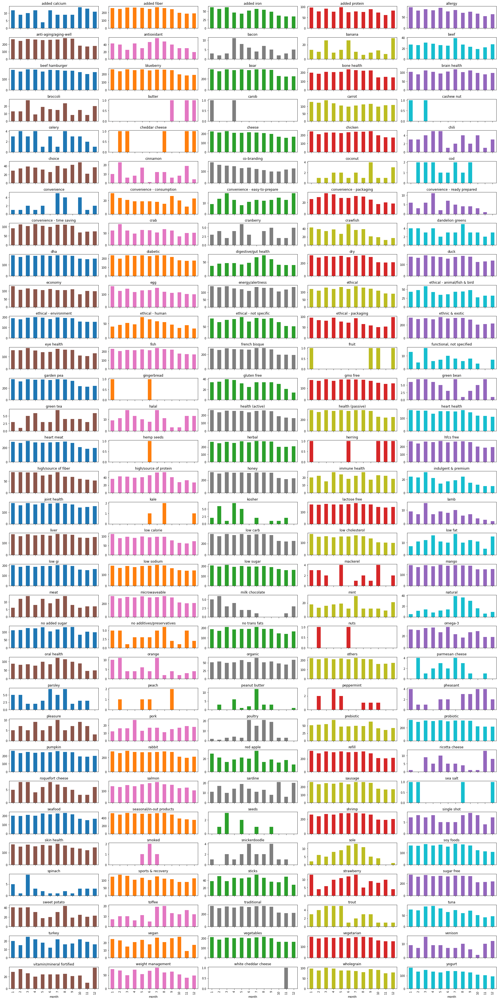

In [25]:
r1=google_search_data.groupby(["month","Claim Name"])["Claim Name"].count().unstack(level=1)
r1.plot(kind = 'bar',subplots=True,layout = (32,5),legend = None)
#plt.rcParams['figure.figsize'] = [25, 30]
plt.tight_layout()

## For Social Media Data

In [5]:
social_media_data.head()
social_media_data["published_date"]=pd.to_datetime(social_media_data["published_date"])

In [6]:
social_media_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 533390 entries, 0 to 533389
Data columns (total 4 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Theme Id        314879 non-null  float64       
 1   published_date  533390 non-null  datetime64[ns]
 2   total_post      533390 non-null  int64         
 3   Claim Name      314879 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 16.3+ MB


In [7]:
social_media_data["published_date"]=social_media_data["published_date"].dt.strftime('%m/%d/%Y')

In [8]:
social_media_data.head(10)

,Theme Id,published_date,total_post,Claim Name
0,148.0,10/01/2015,76,tuna
1,148.0,10/10/2015,31,tuna
2,148.0,10/11/2015,65,tuna
3,148.0,10/12/2015,88,tuna
4,148.0,10/13/2015,85,tuna
5,148.0,10/14/2015,27,tuna
6,148.0,10/15/2015,20,tuna
7,148.0,10/16/2015,10,tuna
8,148.0,10/17/2015,12,tuna
9,148.0,10/18/2015,2,tuna


In [9]:
social_media_data['year'] = pd.DatetimeIndex(social_media_data['published_date']).year
social_media_data['month'] = pd.DatetimeIndex(social_media_data['published_date']).month

In [33]:
plt.rcParams['figure.figsize'] = [25,100]

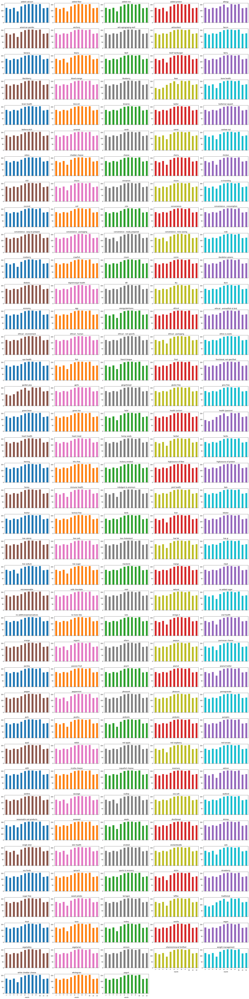

In [34]:
r1=social_media_data.groupby(["month","Claim Name"])["Claim Name"].count().unstack(level=1)
r1.plot(kind = 'bar',subplots=True,layout = (39,5),legend = None)
plt.tight_layout()

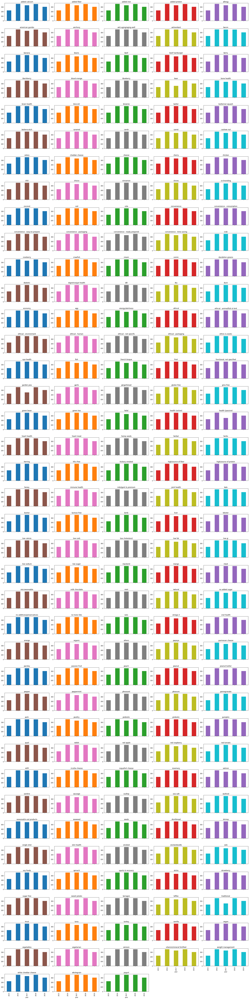

In [35]:
r1=social_media_data.groupby(["year","Claim Name"])["Claim Name"].count().unstack(level=1)
r1.plot(kind = 'bar',subplots=True,layout = (39,5),legend = None)
#plt.rcParams['figure.figsize'] = [25, 30]
plt.tight_layout()

In [45]:

social_media_data["published_date"]=pd.to_datetime(social_media_data["published_date"])
social_media_data["week"] = social_media_data["published_date"].dt.week
social_media_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 533390 entries, 0 to 533389
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Theme Id        314879 non-null  float64       
 1   published_date  533390 non-null  datetime64[ns]
 2   total_post      533390 non-null  int64         
 3   Claim Name      314879 non-null  object        
 4   year            533390 non-null  int64         
 5   month           533390 non-null  int64         
 6   week            533390 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(4), object(1)
memory usage: 28.5+ MB


C:\Users\SUPRIY~1.YAL\AppData\Local\Temp/ipykernel_18444/1002135815.py:2: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  social_media_data["week"] = social_media_data["published_date"].dt.week


In [46]:
social_media_data.head()

,Theme Id,published_date,total_post,Claim Name,year,month,week
0,148.0,2015-10-01,76,tuna,2015,10,40
1,148.0,2015-10-10,31,tuna,2015,10,41
2,148.0,2015-10-11,65,tuna,2015,10,41
3,148.0,2015-10-12,88,tuna,2015,10,42
4,148.0,2015-10-13,85,tuna,2015,10,42


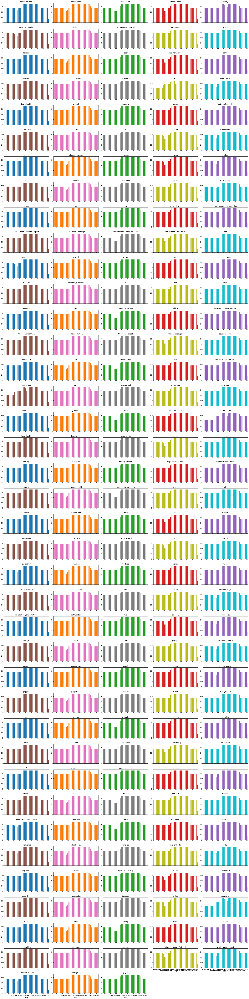

In [47]:
r1=social_media_data.groupby(["week","Claim Name"])["Claim Name"].count().unstack(level=1)
r1.plot(kind = 'bar',subplots=True,layout = (39,5),legend = None)
#plt.rcParams['figure.figsize'] = [25, 30]
plt.tight_layout()

# Understand the overall market share of our client

In [5]:
df= sales_data.groupby("Vendor").sales_dollars_value.sum()

In [6]:
df

Vendor
A                7793646835
B                3825615222
D                2964614082
E                 461947881
F                1304249895
G                 469644666
H                 656861380
Others           4040748239
Private Label    2150344048
Name: sales_dollars_value, dtype: int64

In [7]:
share_A=(df["A"]/sum(df))*100
share_A

32.92950296647187

In [8]:
labels=['A','B','D','E','F','G','H','Others','Private']

overall market share


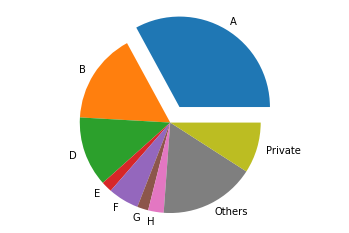

In [9]:
myexplode = [0.2, 0, 0, 0,0,0,0,0,0]
plt.pie(df, labels=labels,explode=myexplode)
plt.axis('equal')
print("overall market share")
plt.show()

In [10]:
type(df)

pandas.core.series.Series

In [11]:
c=list(sales_data["Claim Name"].unique())
c

['american gumbo',
 'american southwest style',
 'apple cinnamon',
 'beans',
 'beef hamburger',
 'blueberry',
 'brown ale',
 'buckwheat',
 'cherry',
 'chicken',
 'cocoa',
 'convenience - easy-to-prepare',
 'cookie',
 'crab',
 'cumin',
 'energy/alertness',
 'ethical - packaging',
 'ethnic & exotic',
 'french bisque',
 'gingerbread',
 'gmo free',
 'herbs',
 'high/source of protein',
 'low calorie',
 'low carb',
 'low sodium',
 'low sugar',
 'no additives/preservatives',
 'No Claim',
 'nuts',
 'peach',
 'pizza',
 'pollock',
 'poultry',
 'prebiotic',
 'red raspberry',
 'salmon',
 'scallop',
 'sea salt',
 'soy foods',
 'stroganoff',
 'tilapia',
 'vegetarian']

In [13]:
df= sales_data.groupby(["Claim Name","Vendor"]).sales_dollars_value.sum()
df

Claim Name  Vendor
No Claim    A         6074735842
            B         2370230668
            D         1941607921
            E          461947881
            F           34124847
                         ...    
tilapia     A             564694
            Others        129456
vegetarian  B            4195612
            H               1536
            Others        673635
Name: sales_dollars_value, Length: 168, dtype: int64

In [14]:
d={}
for i in c:
    try:
        share_A=(df[i]["A"]/sum(df[i]))*100
        d[i]=share_A
        #print("A Share in ",i,"is",share_A)
    except:
        d[i]=0
        #print("A Share in ",i,"is 0")
d

{'american gumbo': 1.0515563174394438,
 'american southwest style': 23.87457068064784,
 'apple cinnamon': 18.10941326822694,
 'beans': 2.2521487965135223,
 'beef hamburger': 0,
 'blueberry': 9.42701414818658,
 'brown ale': 3.027534060684691,
 'buckwheat': 17.090022608215545,
 'cherry': 0,
 'chicken': 26.173280556555866,
 'cocoa': 0,
 'convenience - easy-to-prepare': 0,
 'cookie': 8.802966173268615,
 'crab': 1.7198174063684395,
 'cumin': 0,
 'energy/alertness': 0,
 'ethical - packaging': 0,
 'ethnic & exotic': 30.426782436525258,
 'french bisque': 1.9970702678594676,
 'gingerbread': 4.209975739189158,
 'gmo free': 0.4025908358407009,
 'herbs': 0,
 'high/source of protein': 9.102613668768285,
 'low calorie': 0,
 'low carb': 13.371535668139325,
 'low sodium': 11.809141302170021,
 'low sugar': 33.71332867410356,
 'no additives/preservatives': 11.968130113799386,
 'No Claim': 41.27537458308992,
 'nuts': 0,
 'peach': 0,
 'pizza': 17.08445639218007,
 'pollock': 21.80088591829852,
 'poultry': 

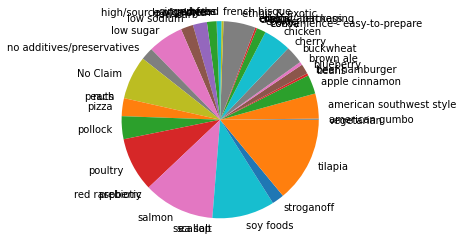

In [110]:
labels = []
sizes = []

for x, y in d.items():
    labels.append(x)
    sizes.append(y)

# Plot
plt.pie(sizes, labels=labels)

plt.axis('equal')
plt.show()

In [15]:
v=list(sales_data["Vendor"].unique())
v

['A', 'Others', 'Private Label', 'F', 'H', 'B', 'D', 'E', 'G']

american gumbo
[1.0515563174394438, 38.1955267152933, 42.70914082371303, 14.3849070453821, 3.658869098172131, 0, 0, 0, 0]


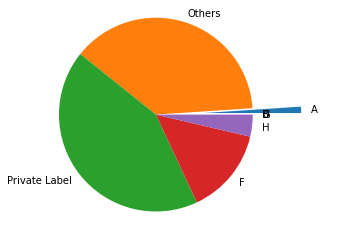

american southwest style
[23.87457068064784, 71.47344898534372, 2.106717642288773, 2.545262691719661, 0, 0, 0, 0, 0]


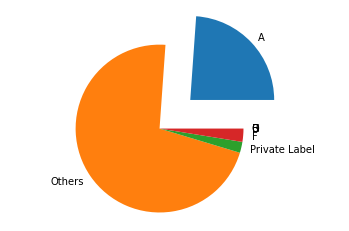

apple cinnamon
[18.10941326822694, 28.566062135531677, 4.604900527168023, 5.365127238820655, 7.9736543754590965, 28.08920477992054, 7.291637674873064, 0, 0]


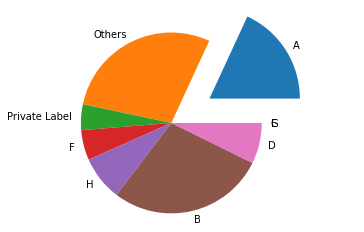

beans
[2.2521487965135223, 86.63791167734979, 0.5216846562280434, 0, 0, 0, 10.588254869908642, 0, 0]


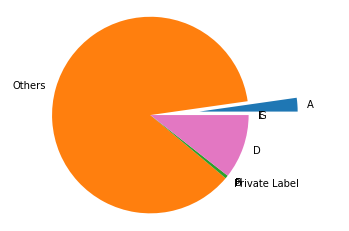

beef hamburger
[0, 100.0, 0, 0, 0, 0, 0, 0, 0]


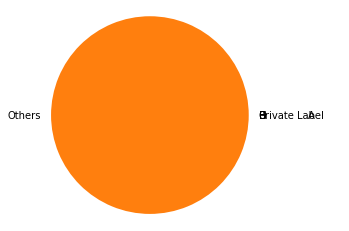

blueberry
[9.42701414818658, 79.09085881780689, 3.3368894959969095, 7.270244420537067, 0, 0.8749931174725596, 0, 0, 0]


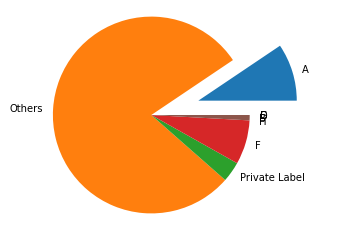

brown ale
[3.027534060684691, 74.54841964293391, 14.685074492784647, 0, 7.738942155317257, 2.9648279495516732e-05, 0, 0, 0]


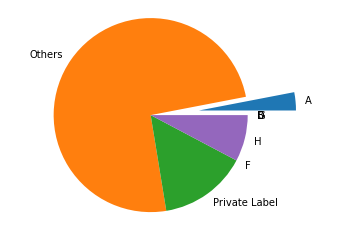

buckwheat
[17.090022608215545, 50.864792048742814, 2.8216926082413365, 0.7267210961980319, 1.4602522101559876, 10.943492781802929, 16.093026646643352, 0, 0]


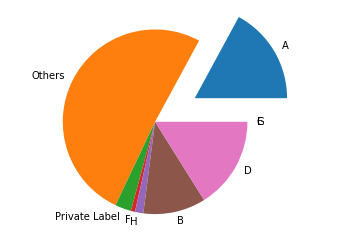

cherry
[0, 100.0, 0, 0, 0, 0, 0, 0, 0]


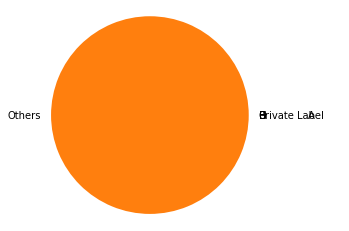

chicken
[26.173280556555866, 55.37679118829276, 11.553750246321243, 2.917338537743293, 0, 1.4621261691611978, 2.5167133019256323, 0, 0]


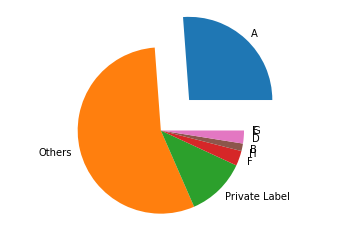

cocoa
[0, 100.0, 0, 0, 0, 0, 0, 0, 0]


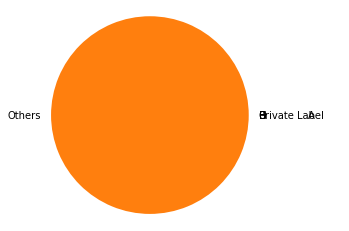

convenience - easy-to-prepare
[0, 100.0, 0, 0, 0, 0, 0, 0, 0]


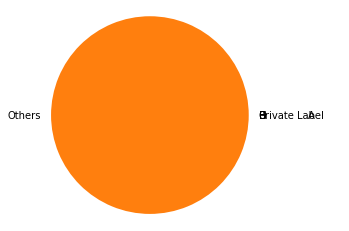

cookie
[8.802966173268615, 1.7918509666539333, 6.342400595827831, 0, 0.577245344941508, 71.6202494911782, 10.865287428129914, 0, 0]


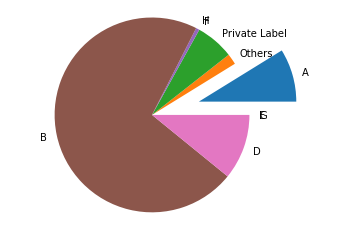

crab
[1.7198174063684395, 95.72421600242676, 0, 2.555966591204808, 0, 0, 0, 0, 0]


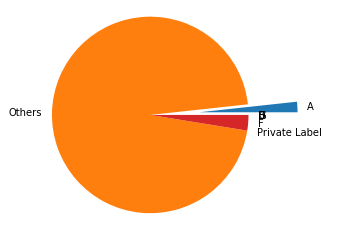

cumin
[0, 100.0, 0, 0, 0, 0, 0, 0, 0]


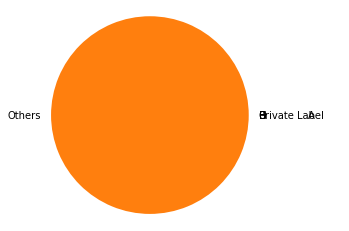

energy/alertness
[0, 97.69765512240357, 2.302344877596413, 0, 0, 0, 0, 0, 0]


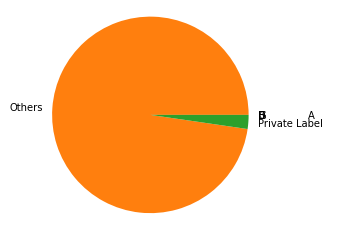

ethical - packaging
[0, 4.106083517506106, 0, 0, 0, 95.89391648249389, 0, 0, 0]


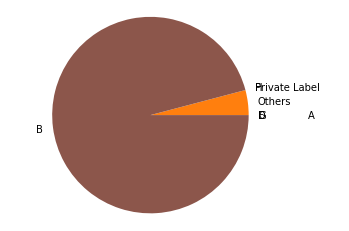

ethnic & exotic
[30.426782436525258, 23.838889947080833, 1.2036813534957074e-06, 1.191228066212441, 12.477218073482556, 26.384734588883457, 5.681145684134104, 0, 0]


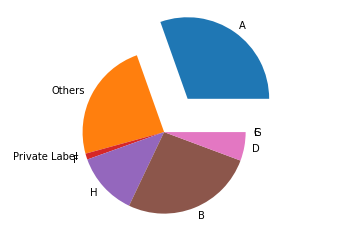

french bisque
[1.9970702678594676, 48.924970938188466, 0, 0, 0, 18.462498514363084, 30.61546027958898, 0, 0]


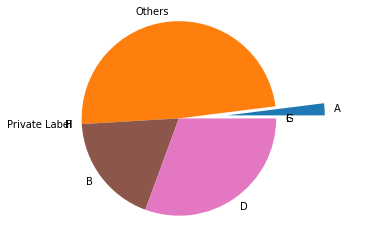

gingerbread
[4.209975739189158, 23.185098279614298, 0, 1.4497531868333902, 0.1646119625383799, 70.97781992459954, 0.012740907225239961, 0, 0]


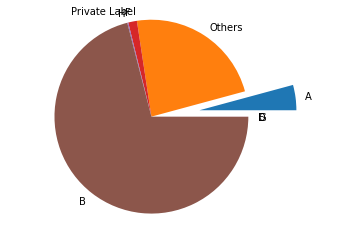

gmo free
[0.4025908358407009, 44.87404614060772, 0, 54.024941146365656, 0.11226068107069564, 0.5861611961152329, 0, 0, 0]


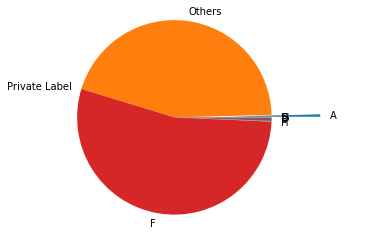

herbs
[0, 100.0, 0, 0, 0, 0, 0, 0, 0]


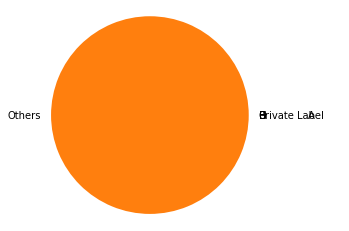

high/source of protein
[9.102613668768285, 90.89738633123171, 0, 0, 0, 0, 0, 0, 0]


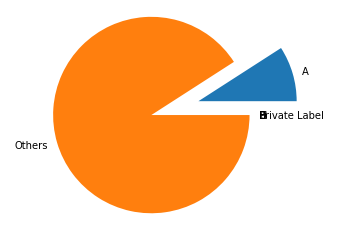

low calorie
[0, 100.0, 0, 0, 0, 0, 0, 0, 0]


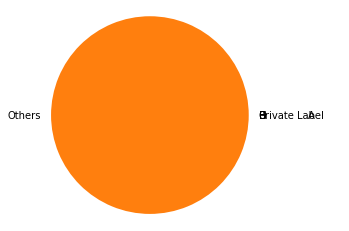

low carb
[13.371535668139325, 48.88993770822355, 8.546876147144038, 10.933676498362232, 0.5197167513393501, 3.342029224675817, 14.396228002115691, 0, 0]


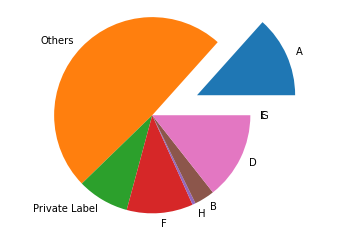

low sodium
[11.809141302170021, 74.02450760795017, 2.0173600764670034, 1.2076124621025115, 0, 10.941378551310285, 0, 0, 0]


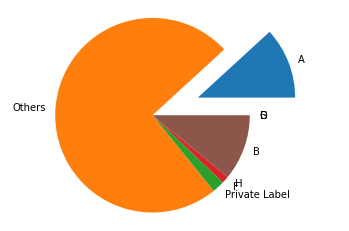

low sugar
[33.71332867410356, 60.13966964750126, 6.147001678395175, 0, 0, 0, 0, 0, 0]


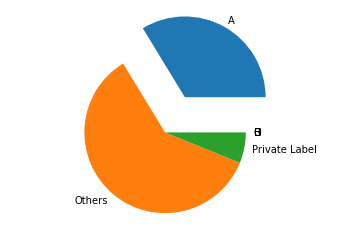

no additives/preservatives
[11.968130113799386, 26.136497911484945, 0.5783076924290195, 24.138174288399718, 2.0286713391495805, 26.55560993482327, 8.594608719914081, 0, 0]


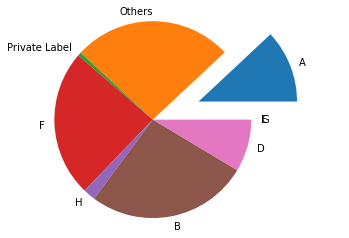

No Claim
[41.27537458308992, 8.634770400380999, 11.990798389841041, 0.2318645417924713, 2.2401969581769836, 16.104759320335802, 13.192441007670974, 3.138749127873542, 3.191045670838267]


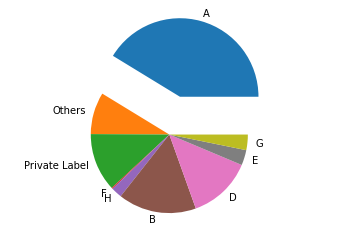

nuts
[0, 96.4097495111341, 3.5902504888658933, 0, 0, 0, 0, 0, 0]


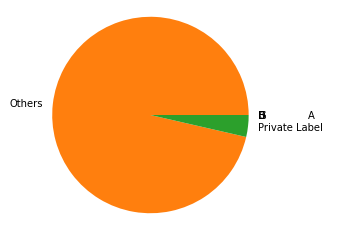

peach
[0, 100.0, 0, 0, 0, 0, 0, 0, 0]


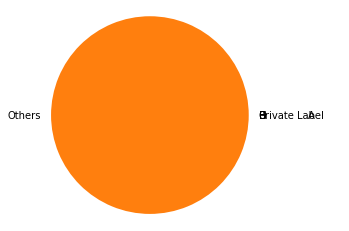

pizza
[17.08445639218007, 6.006833874258434, 8.625453517882315, 0.01668014482169166, 2.7687509480283627, 65.10853737616799, 0.3892877466611419, 0, 0]


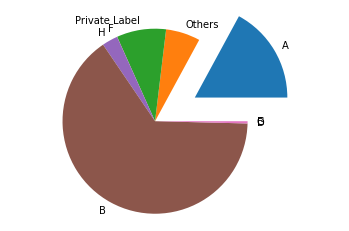

pollock
[21.80088591829852, 28.78732228371213, 4.8324895896280555, 2.1590083371479487, 1.0816553177621082, 27.733247381002485, 13.605391172448753, 0, 0]


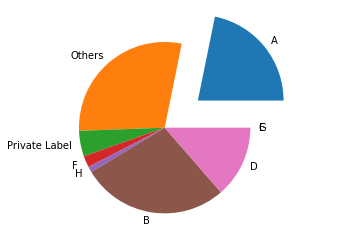

poultry
[51.54157120714399, 38.68726659698052, 0, 0, 0, 9.771162195875487, 0, 0, 0]


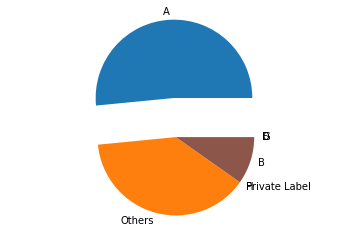

prebiotic
[0, 100.0, 0, 0, 0, 0, 0, 0, 0]


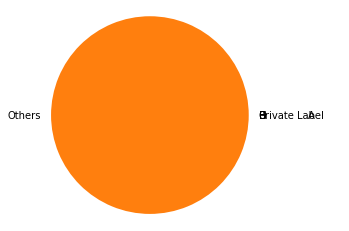

red raspberry
[0, 0, 1.9958338068823145, 0, 0, 98.00416619311768, 0, 0, 0]


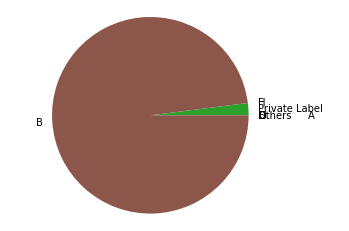

salmon
[67.71972693731043, 3.7322160294832765, 11.502338914384334, 0.15173439598626037, 1.7872228013602658, 2.93704009296349, 12.169720828511958, 0, 0]


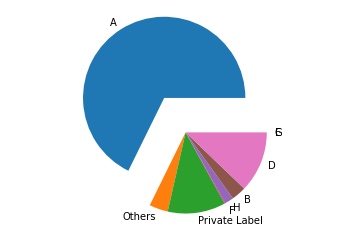

scallop
[0, 100.0, 0, 0, 0, 0, 0, 0, 0]


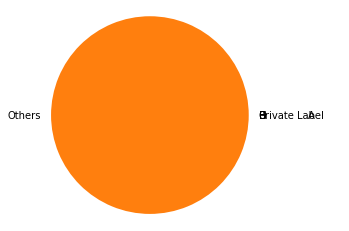

sea salt
[0, 100.0, 0, 0, 0, 0, 0, 0, 0]


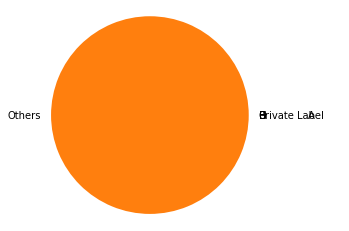

soy foods
[59.535959976084165, 2.291684234430944, 0.6547699571282692, 3.8169639218341436, 7.503440494390391, 17.423359249865356, 8.773822166266736, 0, 0]


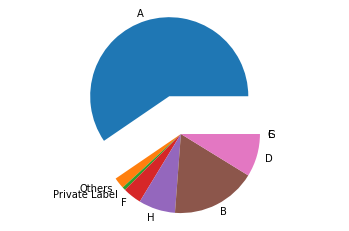

stroganoff
[11.588737005283038, 18.26717502599212, 0, 31.602986537026805, 9.441012083571017, 11.720401327086732, 17.379688021040288, 0, 0]


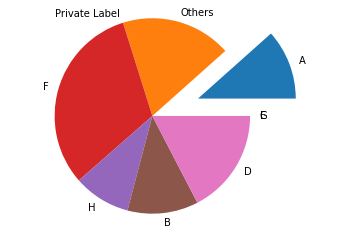

tilapia
[81.35042858171865, 18.64957141828135, 0, 0, 0, 0, 0, 0, 0]


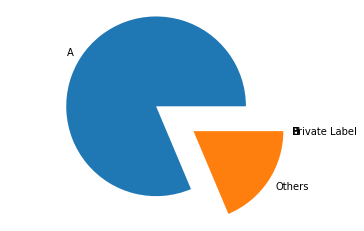

vegetarian
[0, 13.830117252195388, 0, 0, 0.03153497086608047, 86.13834777693853, 0, 0, 0]


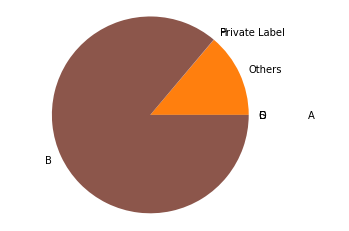

In [113]:
myexplode = [0.5, 0, 0, 0,0,0,0,0,0]
for i in c:
    print(i)
    labels = []
    sizes = []

    for j in v:
        labels.append(j)
        try:
            s=(df[i][j]/sum(df[i]))*100
            sizes.append(s)
            #print("A Share in ",i,"is",share_A)
        except:
            sizes.append(0)
            #print("A Share in ",i,"is 0")
    print(sizes)
        
    plt.pie(sizes, labels=labels,explode=myexplode)

    plt.axis('equal')
    plt.show()

In [16]:
sales_data.head()

,system_calendar_key_N,product_id,sales_dollars_value,sales_units_value,sales_lbs_value,Claim ID,Vendor,Claim Name,Date,year,month
0,20160109,29698,185,31,17,147,A,american gumbo,09-01-2016,2016,01
1,20160116,29698,264,45,25,147,A,american gumbo,16-01-2016,2016,01
2,20160123,11925,150,5,45,147,A,american gumbo,23-01-2016,2016,01
3,20160123,29698,188,35,20,147,A,american gumbo,23-01-2016,2016,01
4,20160130,11925,130,5,45,147,A,american gumbo,30-01-2016,2016,01


# Emerging Trends in various data sources

C:\Users\mahathi.paidimar\Miniconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<Figure size 360x144 with 0 Axes>

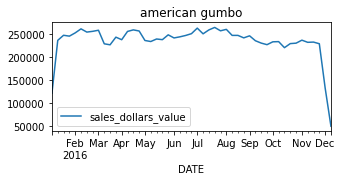

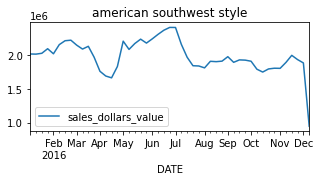

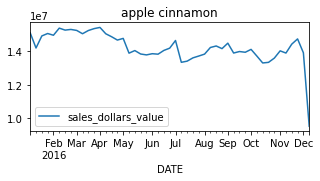

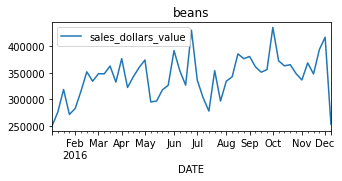

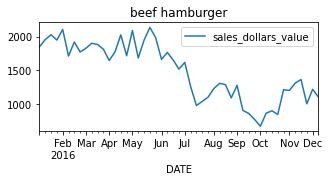

...

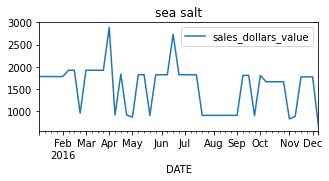

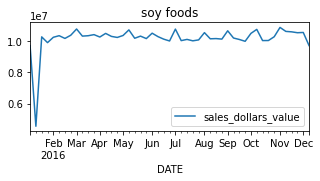

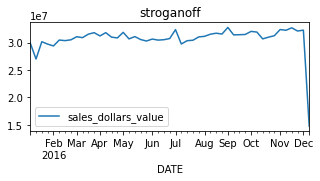

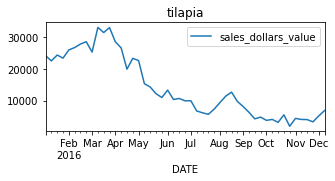

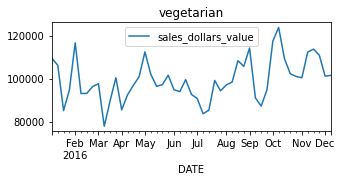

In [51]:
##EMERGING TRENDS IN SALES DATA

sales_data_1 = pd.read_excel("Case_Study/Emerging Business Opportunities (Karthik)/sales_data.xlsx", sheet_name = "sales_data")
df_grouped = sales_data_1.groupby(by=[pd.Grouper(key="DATE", freq="1W"), "Claim Name"])["sales_dollars_value"]
df_grouped = df_grouped.sum().reset_index()
categories = sales_data["Claim Name"].unique().tolist()
plt.rcParams['figure.figsize'] = [5, 2]
plt.tight_layout()
for category in categories:
    df_category = df_grouped.loc[df_grouped["Claim Name"] == category].copy()
    df_category.plot(
        x="DATE", 
        y=["sales_dollars_value"], 
        kind = "line",
        title=f"{category}")

C:\Users\mahathi.paidimar\Miniconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<Figure size 360x144 with 0 Axes>

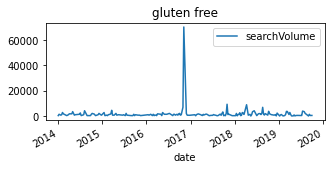

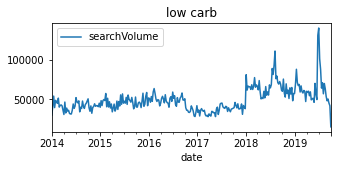

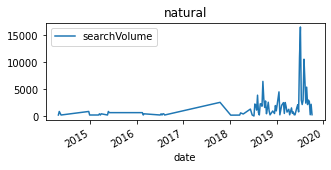

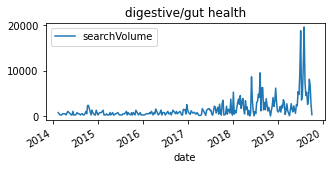

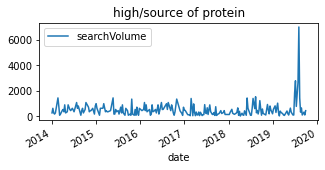

...

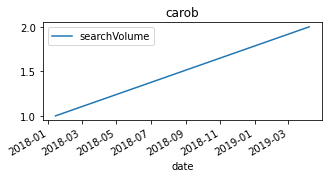

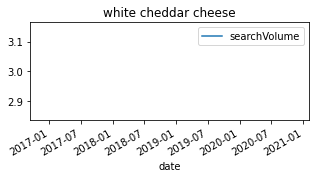

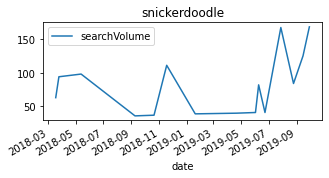

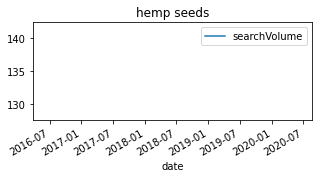

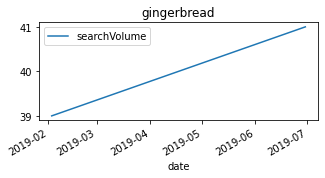

In [52]:
##EMERGING TRENDS IN GOOGLE SEARCH DATA

df_grouped = google_search_data.groupby(by=[pd.Grouper(key="date", freq="1W"), "Claim Name"])["searchVolume"]
df_grouped = df_grouped.sum().reset_index()
categories = google_search_data["Claim Name"].unique().tolist()
plt.rcParams['figure.figsize'] = [5, 2]
plt.tight_layout()
for category in categories:
    df_category = df_grouped.loc[df_grouped["Claim Name"] == category].copy()
    df_category.plot(
        x="date", 
        y=["searchVolume"], 
        kind = "line",
        title=f"{category}")

In [56]:
social_media_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 533390 entries, 0 to 533389
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Theme Id        533390 non-null  int64 
 1   published_date  533390 non-null  object
 2   total_post      533390 non-null  int64 
 3   YEAR            533390 non-null  int64 
 4   MONTH           533390 non-null  object
 5   WEEK_NUM        533390 non-null  int64 
 6   Claim Name      533390 non-null  object
dtypes: int64(4), object(3)
memory usage: 28.5+ MB


C:\Users\mahathi.paidimar\Miniconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<Figure size 360x144 with 0 Axes>

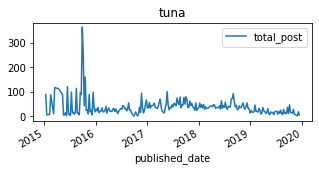

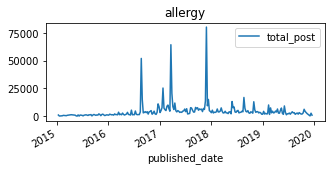

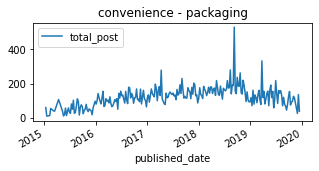

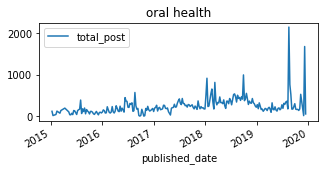

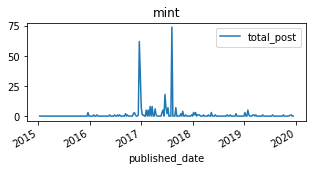

...

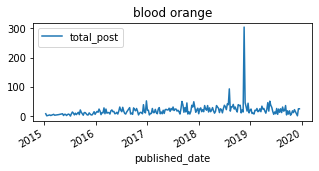

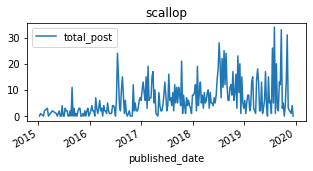

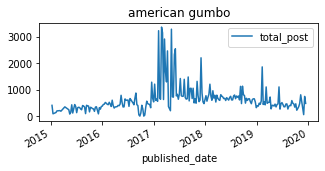

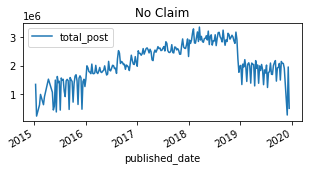

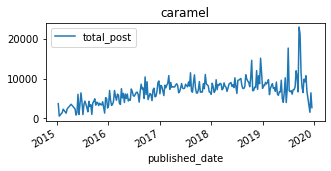

In [57]:
##EMERGING TRENDS IN SOCIAL MEDIA DATA
social_media_data["published_date"] = pd.to_datetime(social_media_data["published_date"],format = "%d-%m-%Y")
df_grouped = social_media_data.groupby(by=[pd.Grouper(key="published_date", freq="1W"), "Claim Name"])["total_post"]
df_grouped = df_grouped.sum().reset_index()
categories = social_media_data["Claim Name"].unique().tolist()
plt.rcParams['figure.figsize'] = [5, 2]
plt.tight_layout()
for category in categories:
    df_category = df_grouped.loc[df_grouped["Claim Name"] == category].copy()
    df_category.plot(
        x="published_date", 
        y=["total_post"], 
        kind = "line",
        title=f"{category}")

# Build the sales model and identify the driver of sales 

In [3]:
sales_data.head()

,system_calendar_key_N,product_id,sales_dollars_value,sales_units_value,sales_lbs_value,Claim ID,Vendor,Claim Name,Date
0,20160109,29698,185,31,17,147,A,american gumbo,09-01-2016
1,20160116,29698,264,45,25,147,A,american gumbo,16-01-2016
2,20160123,11925,150,5,45,147,A,american gumbo,23-01-2016
3,20160123,29698,188,35,20,147,A,american gumbo,23-01-2016
4,20160130,11925,130,5,45,147,A,american gumbo,30-01-2016


In [4]:
sales_data.drop('Date',inplace=True,axis=1)

In [5]:
sales_data.head()

,system_calendar_key_N,product_id,sales_dollars_value,sales_units_value,sales_lbs_value,Claim ID,Vendor,Claim Name
0,20160109,29698,185,31,17,147,A,american gumbo
1,20160116,29698,264,45,25,147,A,american gumbo
2,20160123,11925,150,5,45,147,A,american gumbo
3,20160123,29698,188,35,20,147,A,american gumbo
4,20160130,11925,130,5,45,147,A,american gumbo


In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing, svm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression



In [7]:
df = pd.get_dummies(sales_data, columns=['Vendor','Claim Name'])
df.head()

,system_calendar_key_N,product_id,sales_dollars_value,sales_units_value,sales_lbs_value,Claim ID,Vendor_A,Vendor_B,Vendor_D,Vendor_E,...,Claim Name_poultry,Claim Name_prebiotic,Claim Name_red raspberry,Claim Name_salmon,Claim Name_scallop,Claim Name_sea salt,Claim Name_soy foods,Claim Name_stroganoff,Claim Name_tilapia,Claim Name_vegetarian
0,20160109,29698,185,31,17,147,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,20160116,29698,264,45,25,147,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,20160123,11925,150,5,45,147,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,20160123,29698,188,35,20,147,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,20160130,11925,130,5,45,147,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
X = df.drop(['sales_dollars_value'],axis=1)
y = df['sales_dollars_value']
X

,system_calendar_key_N,product_id,sales_units_value,sales_lbs_value,Claim ID,Vendor_A,Vendor_B,Vendor_D,Vendor_E,Vendor_F,...,Claim Name_poultry,Claim Name_prebiotic,Claim Name_red raspberry,Claim Name_salmon,Claim Name_scallop,Claim Name_sea salt,Claim Name_soy foods,Claim Name_stroganoff,Claim Name_tilapia,Claim Name_vegetarian
0,20160109,29698,31,17,147,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,20160116,29698,45,25,147,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,20160123,11925,5,45,147,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,20160123,29698,35,20,147,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,20160130,11925,5,45,147,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,20161210,9241,72,2160,437,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1048571,20161210,9377,13,114,437,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1048572,20161210,9378,13,257,437,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1048573,20161210,27797,117,1580,437,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
from sklearn import linear_model  
# Splitting the data into training and testing data
regr = linear_model.LinearRegression()
regr.fit(X, y)

LinearRegression()

In [10]:
print(regr.score(X_test, y_test))

0.7747113658920621


In [23]:
pip install mlxtend

Note: you may need to restart the kernel to use updated packages.


In [12]:
X = df.drop(['sales_dollars_value','system_calendar_key_N'],axis=1)
y = df['sales_dollars_value']
X
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
from sklearn import linear_model  
# Splitting the data into training and testing data
regr = linear_model.LinearRegression()
regr.fit(X, y)
print(regr.score(X_test, y_test))

0.7656766884801305


In [16]:

from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.linear_model import LinearRegression
# Sequential Forward Selection(sfs)
sfs = SFS(LinearRegression(),
          k_features=6,
          forward=True,
          floating=False,
          scoring = 'r2',
          cv = 0)

In [17]:
sfs.fit(X, y)
sfs.k_feature_names_ 

('product_id',
 'sales_units_value',
 'sales_lbs_value',
 'Vendor_Others',
 'Vendor_Private Label',
 'Claim Name_stroganoff')

In [18]:
X=df[['product_id',
 'sales_units_value',
 'sales_lbs_value',
 'Vendor_Others',
 'Vendor_Private Label',
 'Claim Name_stroganoff']]

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
from sklearn import linear_model  
# Splitting the data into training and testing data
regr = linear_model.LinearRegression()
regr.fit(X, y)
print(regr.score(X_test, y_test))

0.7696345502990879


C:\Users\supriya.yalavart\Anaconda3\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\supriya.yalavart\Anaconda3\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


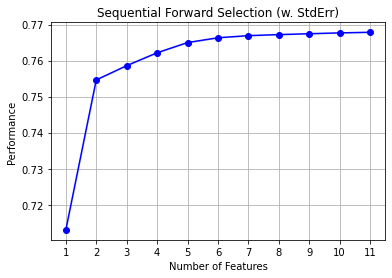

In [33]:
sfs1 = SFS(LinearRegression(),
         k_features=(3,11),
         forward=True,
         floating=False,
         cv=0)
sfs1.fit(X, y)
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt
fig1 = plot_sfs(sfs1.get_metric_dict(), kind='std_dev')
plt.title('Sequential Forward Selection (w. StdErr)')
plt.grid()
plt.show()